In [ ]:
!pip install ultralytics pytesseract opencv-python-headless==4.7.0.72 Pillow
!apt-get update -qq
!apt-get install -y -qq tesseract-ocr libtesseract-dev


  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.3
    Uninstalling numpy-1.26.3:
      Successfully uninstalled numpy-1.26.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.6 which is incompatible.
albumentations 2.0.8 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 4.7.0.72 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.2.6 which is incompatible.
albucore 0.0.24 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 4.7.0.72 which is incompatible.


^C
^C


In [ ]:
!pip install numpy==1.26.3 --force-reinstall


  Using cached numpy-1.26.3-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.3-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.3 which is incompatible.
pytensor 2.35.1 requires numpy>=2.0, but you have numpy 1.26.3 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.3 which is incompatible.
jax 0.7.2 requires numpy>=2.0, but you have numpy 1.26.3 which is incompatible.
jaxlib 0.7.2 requires numpy>=2.0, but you have numpy 1.2

In [ ]:
import numpy as np
print(np.__version__)


1.26.3


In [ ]:
!unzip -q "/content/drive/MyDrive/Colab Notebooks/License Plate Detection.v2i.yolov8.zip" -d /content/dataset


In [ ]:
import os

dataset_path = "/content/dataset"

for root, dirs, files in os.walk(dataset_path):
    level = root.replace(dataset_path, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 4 * (level + 1)
    for f in files[:5]:  # first 5 files per folder
        print(f"{subindent}{f}")


dataset/
    README.dataset.txt
    README.roboflow.txt
    data.yaml
    valid/
        images/
            Cars321_png.rf.2ebb30ba6cab4dbd4ad4f15a2039508f.jpg
            Cars1_png.rf.42f5f9995b259cf8c6c43370442920c5.jpg
            Cars53_png.rf.255dd9508e5ff7e9742ce9b35833a12d.jpg
            Cars64_png.rf.f501e05c6df0b3938fa5f0d57c767d67.jpg
            Cars58_png.rf.b03be995e8400da61952b89e4a5f2419.jpg
        labels/
            Cars5_png.rf.f033ee0176bd3b0dae704f24b9d41e4a.txt
            Cars193_png.rf.ed929cd65e5bc65ced2bc646bd5a9652.txt
            Cars142_png.rf.bef7b22fbb6332bc465bb8d9f8b9d800.txt
            Cars386_png.rf.985c760f019f4e1a80cc9caeba9a9cdf.txt
            Cars12_png.rf.861af42c960daa82db8454c4dfb6c574.txt
    test/
        images/
            Cars20_png.rf.7806316df6b0cbb682e7cc5145a8156d.jpg
            Cars204_png.rf.8634e3064157f8e0fc0d4aab59aa1e28.jpg
            Cars388_png.rf.4f1ca0597948085436df130adef31457.jpg
            Cars59_png.rf.e9df2a9a4334

In [ ]:
!cat /content/dataset/data.yaml


train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['Plate']

roboflow:
  workspace: doraemons-worls
  project: license-plate-detection-lhxcl
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/doraemons-worls/license-plate-detection-lhxcl/dataset/2

In [ ]:
from ultralytics import YOLO

# Load YOLOv8n model (nano version)
model = YOLO("yolov8n.pt")  # pretrained weights

# Train on your license plate dataset
results = model.train(
    data="/content/dataset/data.yaml",  # path to your data.yaml
    epochs=30,                          # number of training epochs
    imgsz=640,                          # image size
    batch=16,                           # batch size
    name="license_plate_yolov8n"        # folder name for saving results
)


Ultralytics 8.3.227 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=license_plate_yolov8n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plot

In [ ]:
from ultralytics import YOLO
from google.colab import files
import cv2
import matplotlib.pyplot as plt

In [ ]:
# 1️⃣ Upload image
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

Saving plate.jpg to plate.jpg


In [ ]:
# 2️⃣ Load trained model
model = YOLO("runs/detect/license_plate_yolov8n/weights/best.pt")

In [ ]:
# 3️⃣ Run detection
results = model.predict(source=image_path)


image 1/1 /content/plate.jpg: 448x640 1 Plate, 45.5ms
Speed: 3.3ms preprocess, 45.5ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


In [ ]:
# 4️⃣ Annotated image
annotated_path = results[0].plot()
annotated_rgb = cv2.cvtColor(annotated_path, cv2.COLOR_BGR2RGB)

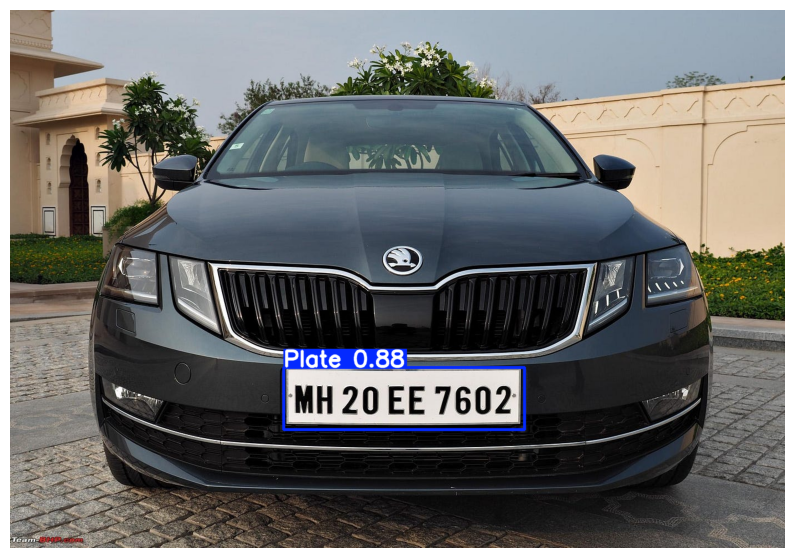

In [ ]:
# 5️⃣ Display
plt.figure(figsize=(10,10))
plt.imshow(annotated_rgb)
plt.axis('off')
plt.show()

In [ ]:
# 6️⃣ Print detected objects
class_names = model.names
for box in results[0].boxes:
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    print(f"Detected object: {class_names[cls_id]} | Confidence: {conf:.2f}")

Detected object: Plate | Confidence: 0.88


In [ ]:
# 1️⃣ Upload image
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

Saving plate1.jpg to plate1.jpg


In [ ]:
# 2️⃣ Load trained model
model = YOLO("runs/detect/license_plate_yolov8n/weights/best.pt")

In [ ]:
# 3️⃣ Run detection
results = model.predict(source=image_path)


image 1/1 /content/plate1.jpg: 384x640 1 Plate, 38.7ms
Speed: 1.7ms preprocess, 38.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


In [ ]:
# 4️⃣ Annotated image
annotated_path = results[0].plot()
annotated_rgb = cv2.cvtColor(annotated_path, cv2.COLOR_BGR2RGB)

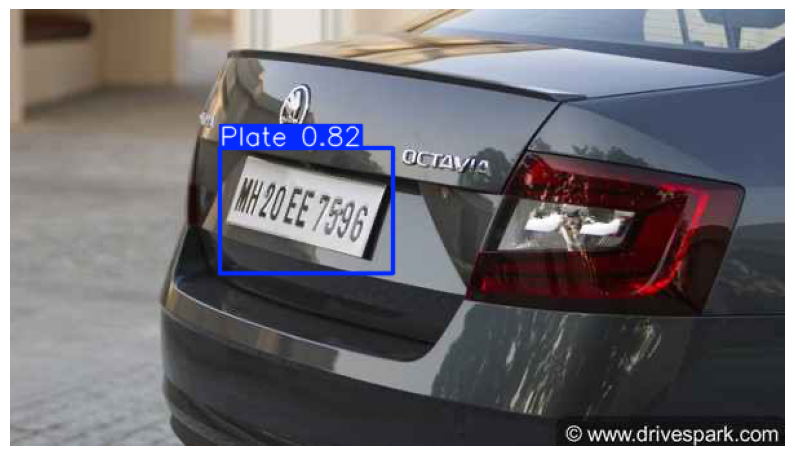

In [ ]:
# 5️⃣ Display
plt.figure(figsize=(10,10))
plt.imshow(annotated_rgb)
plt.axis('off')
plt.show()

In [ ]:
# 6️⃣ Print detected objects
class_names = model.names
for box in results[0].boxes:
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    print(f"Detected object: {class_names[cls_id]} | Confidence: {conf:.2f}")

Detected object: Plate | Confidence: 0.82


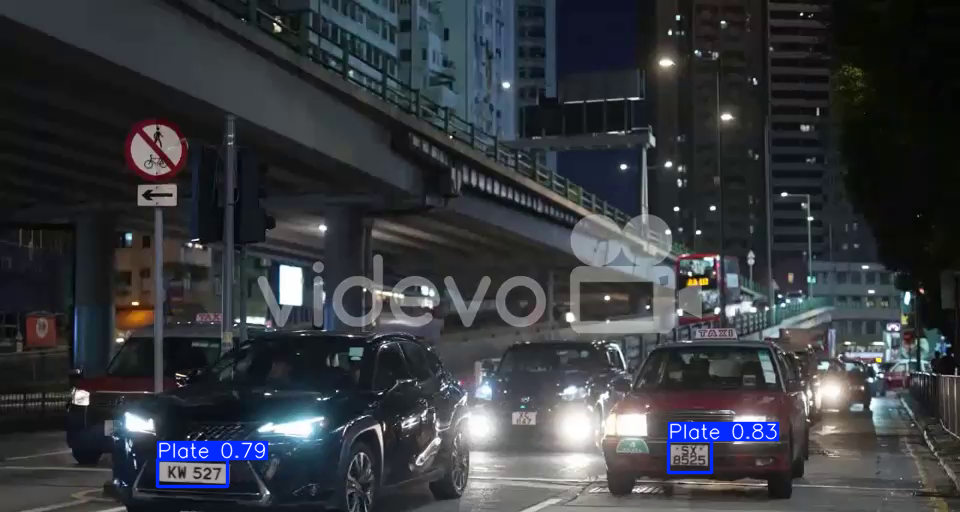

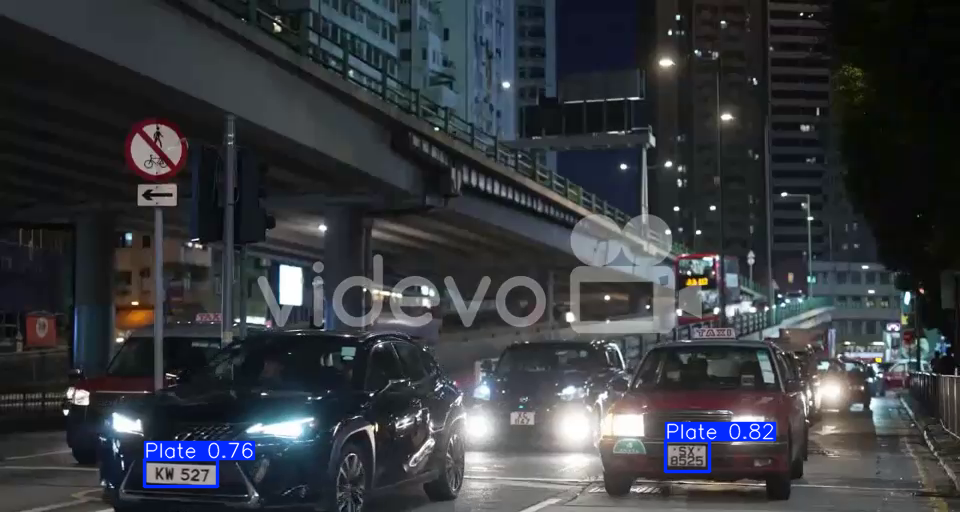

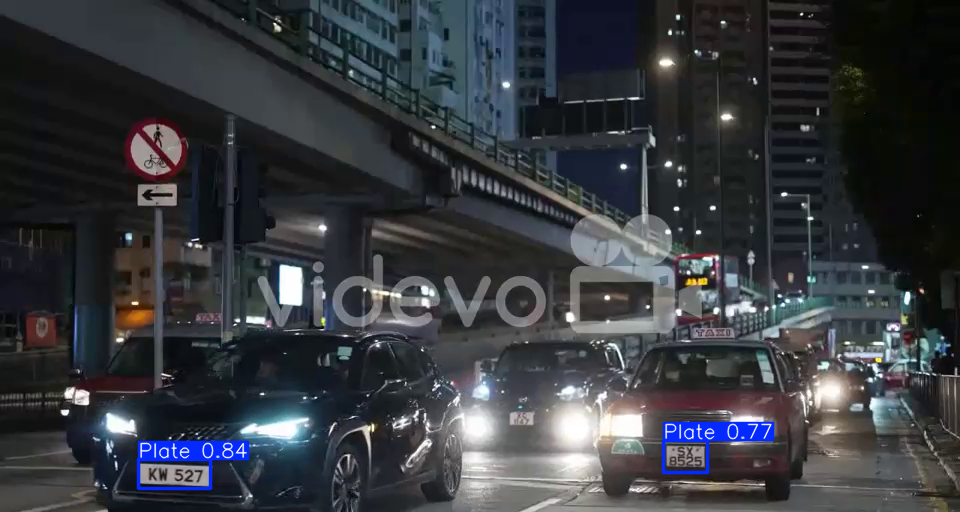

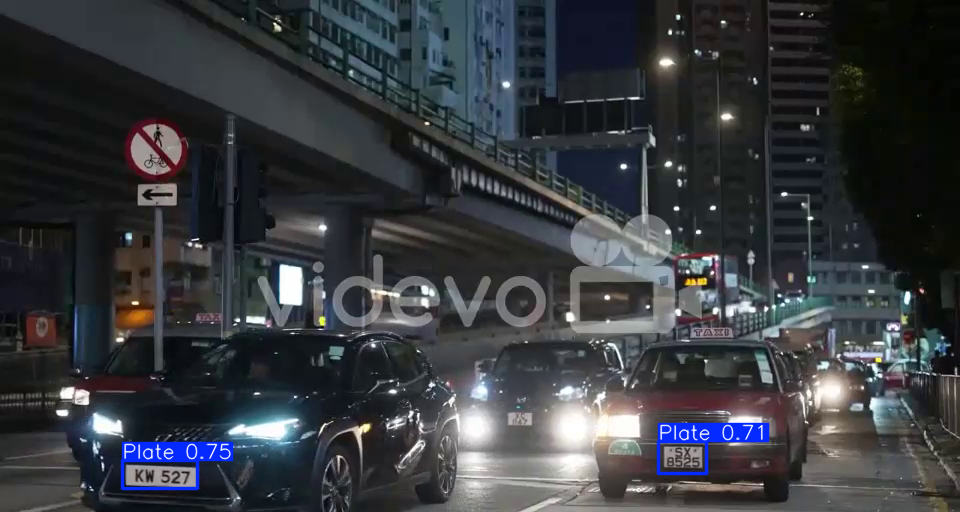

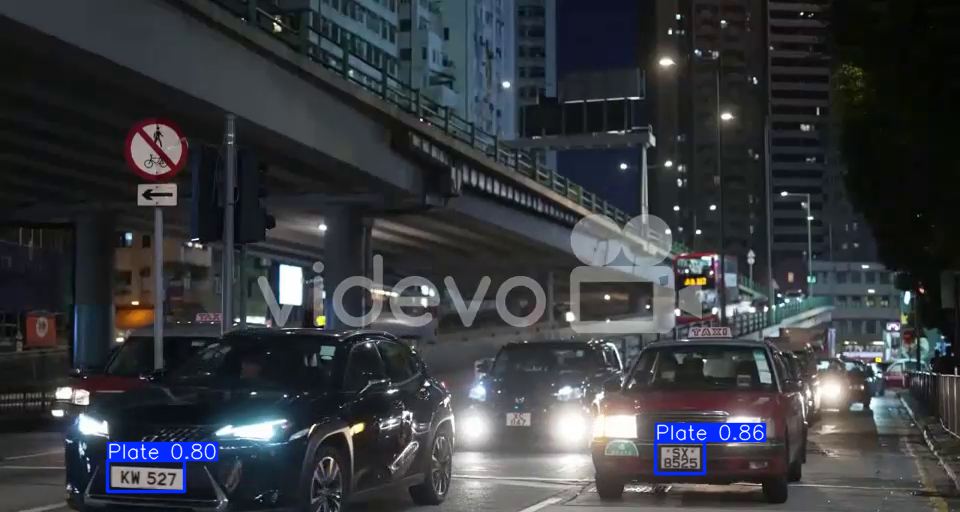

...

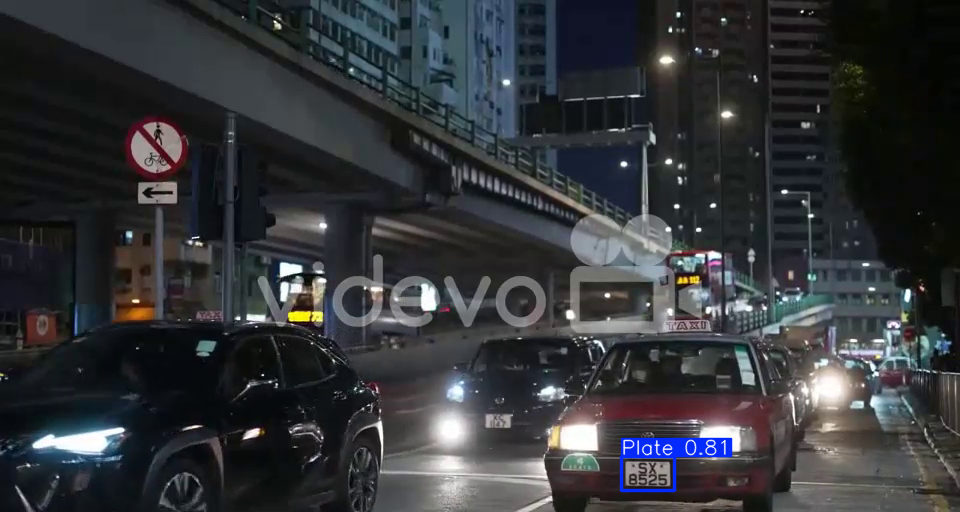

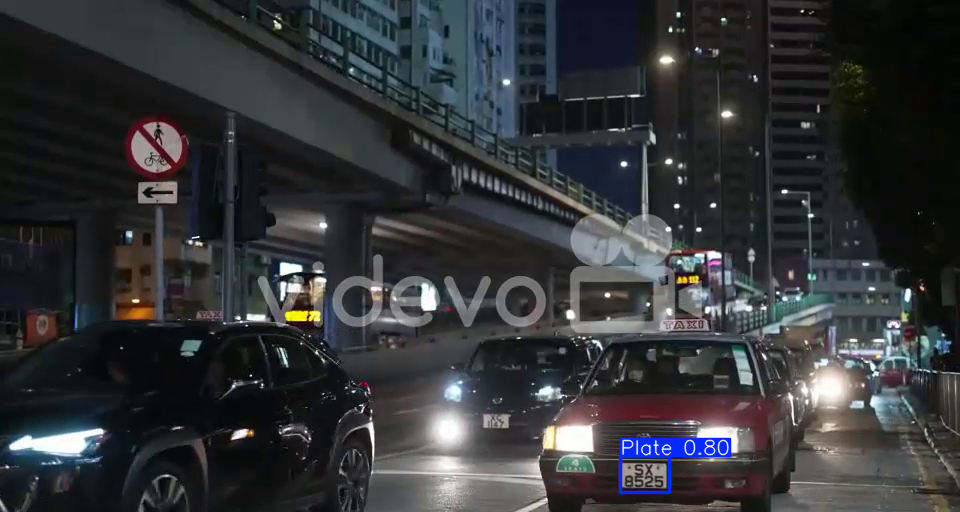

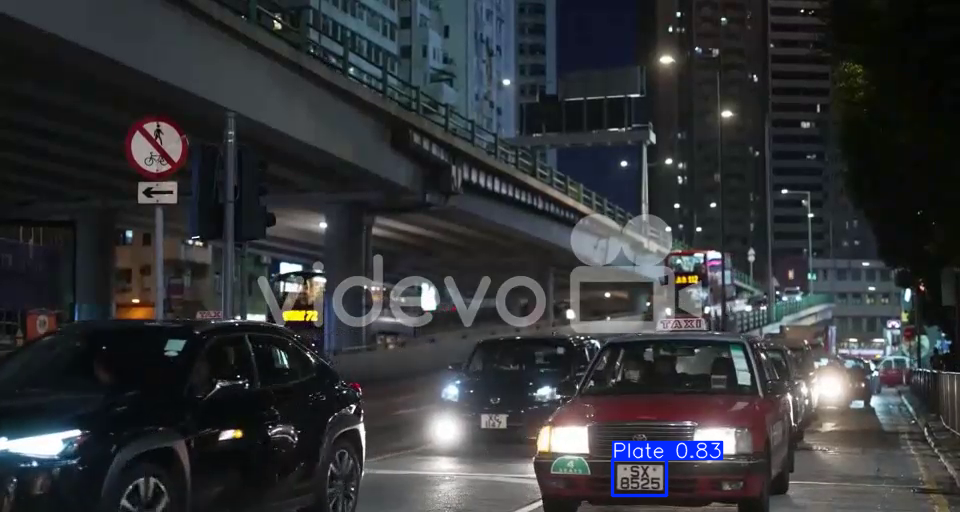

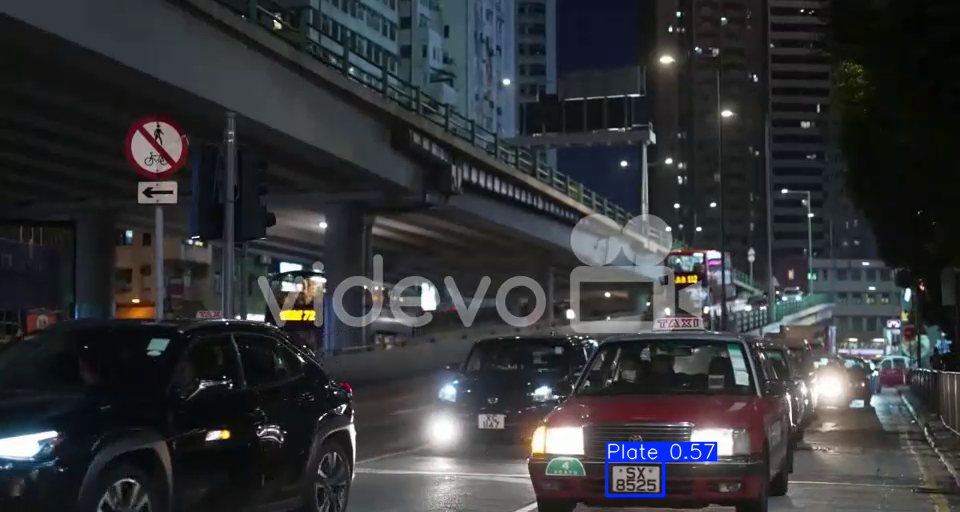

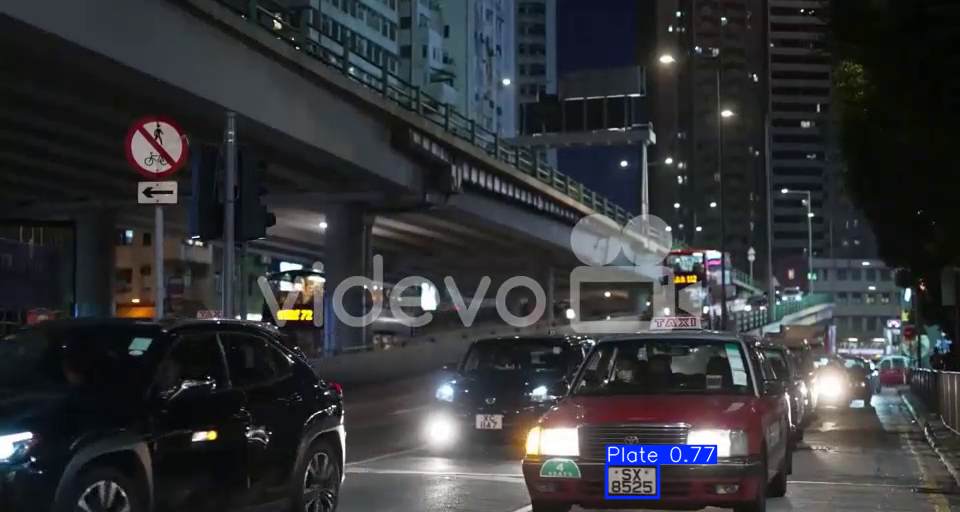

✅ Detection completed and video saved at: /content/output_video.mp4


In [ ]:
from google.colab.patches import cv2_imshow
import cv2
from ultralytics import YOLO
from IPython.display import Video

# === Paths ===
video_path = "/content/drive/MyDrive/Colab Notebooks/WhatsApp Video 2025-11-11 at 11.25.20 PM (1).mp4"
output_path = "/content/output_video.mp4"

# === Load YOLO model ===
model = YOLO("runs/detect/license_plate_yolov8n/weights/best.pt")

cap = cv2.VideoCapture(video_path)
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps    = cap.get(cv2.CAP_PROP_FPS)
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLO detection
    results = model.predict(source=frame, conf=0.5, verbose=False)
    annotated_frame = results[0].plot()  # Bounding boxes and labels draw karega

    # Save annotated frame in output video
    out.write(annotated_frame)

    # Show few frames in notebook
    if frame_count < 20:
        cv2_imshow(annotated_frame)

    frame_count += 1

cap.release()
out.release()

print("✅ Detection completed and video saved at:", output_path)


In [ ]:
import cv2, pytesseract, os
from ultralytics import YOLO

# === Paths ===
video_path = "/content/drive/MyDrive/Colab Notebooks/WhatsApp Video 2025-11-11 at 11.25.20 PM (1).mp4"
output_folder = "/content/ocr_results"
os.makedirs(output_folder, exist_ok=True)

# === Load YOLO model ===
model = YOLO("runs/detect/license_plate_yolov8n/weights/best.pt")

cap = cv2.VideoCapture(video_path)
frame_index = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLO detection
    results = model.predict(source=frame, conf=0.5, verbose=False)

    # For each detected plate
    for i, box in enumerate(results[0].boxes):
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        plate_crop = frame[y1:y2, x1:x2]

        # ======== OCR PROCESSING ========
        gray = cv2.cvtColor(plate_crop, cv2.COLOR_BGR2GRAY)
        gray = cv2.bilateralFilter(gray, 11, 17, 17)
        _, thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY)
        text = pytesseract.image_to_string(thresh, config='--psm 7')
        text_clean = text.strip()

        # Print extracted text
        print(f"Frame {frame_index}, Plate {i}: {text_clean}")

        # Optionally, save image with detected text
        annotated_plate = plate_crop.copy()
        cv2.putText(
            annotated_plate, text_clean, (5, 25),
            cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2
        )
        cv2.imwrite(f"{output_folder}/plate_{frame_index}_{i}.jpg", annotated_plate)

    frame_index += 1

cap.release()
print("✅ OCR completed! Results saved to:", output_folder)


Frame 0, Plate 0: & 6d
Frame 0, Plate 1: KW §27
Frame 1, Plate 0: nn
Frame 1, Plate 1: | KW 527°
Frame 2, Plate 0: KM 527
Frame 2, Plate 1: eee]
Frame 3, Plate 0: Ka 527
Frame 3, Plate 1: ae
Frame 4, Plate 0: eva
Frame 4, Plate 1: 10 527
Frame 5, Plate 0: L tities
Frame 5, Plate 1: 7
Frame 6, Plate 0: ae
Frame 6, Plate 1: | ie sa7
Frame 7, Plate 0: | ae?
Frame 7, Plate 1: ase
Frame 8, Plate 0: Beis
Frame 8, Plate 1: » Fu
Frame 9, Plate 0: alae
Frame 9, Plate 1: TV?
Frame 10, Plate 0: oa
Frame 10, Plate 1: ao
Frame 11, Plate 0: ise
Frame 12, Plate 0: Lotte
Frame 12, Plate 1: o |
Frame 13, Plate 0: ae
Frame 14, Plate 0: ae
Frame 15, Plate 0: Lane!
Frame 16, Plate 0: ee
Frame 17, Plate 0: De 3 tal
Frame 18, Plate 0: Dak
Frame 19, Plate 0: Le |
Frame 20, Plate 0: Lae
Frame 21, Plate 0: Laie|
Frame 22, Plate 0: aXe
Frame 24, Plate 0: i
Frame 26, Plate 0: Loan |
Frame 27, Plate 0: alte
Frame 68, Plate 0: Lmtd
Frame 69, Plate 0: ho
Frame 70, Plate 0: bem |
Frame 72, Plate 0: | tel
Frame 74, P